## **Finding a set of companies that outperforms S&P500**

### **Context and Problem Statement**

Active investing in the asset management industry **aims to beat the stock market’s average returns**, for which portfolio managers track a particular index and try to beat that index by creating their own portfolios. 

Portfolio construction involves selection of stocks that have a **higher probability of giving better returns** in comparison to the tracking index, like **S&P 500**. In this project, we will use the concept of Network Analysis to select a basket of stocks and create two portfolios. We will then simulate portfolio value by investing a certain amount, keeping the portfolio for an entire year and we will then compare it against the S&P 500 index. 

In this project we will try to follow the approach mentioned in the below research paper: 

**[Dynamic portfolio strategy using a clustering
approach](https://arxiv.org/pdf/1608.03058.pdf)**

### **Proposed Approach**

- Collect the price data for all S&P 500 components from 2011 till 2020
- Compute log returns for the S&P 500 components for same time period
- Compute the **correlation matrix** for the above log returns
- Find out the **Top n central and peripheral stocks** based on the following network topological parameters:
    - Degree centrality
    - Betweenness centrality
    - Distance on degree criterion
    - Distance on correlation criterion
    - Distance on distance criterion
- Simulate the performance of central and peripheral portfolios against the performance of S&P 500 for the year 2021    

### **Loading the Libraries**

In [42]:
import tqdm #for listing the current status
import requests
import numpy as np
import pandas as pd
import seaborn as sns
import networkx as nx
import plotly.express as px
from bs4 import BeautifulSoup
import matplotlib.pyplot as plt
import yfinance as yf 
from yahoo_fin import stock_info as si

import warnings
warnings.filterwarnings('ignore')

### **Getting A list of Hong Kong Stocks**

In [2]:
cd E:\Network_Presentation\raw_data_books

E:\Network_Presentation\raw_data_books


In [3]:
sp = si.tickers_sp500()

### **Getting the Price Data for all the S&P 500 components in the last 10 years**

In [60]:
price_data = yf.download(sp[0],'2011-01-01','2022-10-17')
price_data = price_data['Adj Close']
stk = [sp[0]]
for i in range(1,len(sp)):
    try:
        df = yf.download(sp[i],'2011-01-01','2022-10-17')
        df = df['Adj Close']
        stk.append(sp[i])
        price_data = pd.concat([price_data,df],axis=1)
    except:
        continue

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

In [61]:
price_data.columns = stk

In [62]:
price_data = price_data.iloc[1:]
price_data

,A,AAL,AAPL,ABBV,ABNB,ABT,ACGL,ACN,ADBE,ADI,...,WYNN,XEL,XOM,XRAY,XYL,YUM,ZBH,ZBRA,ZION,ZTS
Date,,,,,,,,,,,,,,,,,,,,,
2011-01-04,26.761719,10.011913,10.042777,NaN,NaN,17.534925,9.771111,37.938488,31.510000,27.715338,...,79.662460,15.459666,45.591145,31.509117,NaN,27.222038,47.707191,37.840000,19.960485,NaN
2011-01-05,26.703672,10.464429,10.124928,NaN,NaN,17.534925,9.785556,37.946354,32.220001,27.774446,...,80.690247,15.368184,45.469410,31.808701,NaN,27.351572,47.742374,37.799999,20.073353,NaN
2011-01-06,26.755274,10.596413,10.116745,NaN,NaN,17.498598,9.653333,38.087822,32.270000,27.929564,...,81.278542,15.355118,45.761593,31.627129,NaN,27.543032,46.264713,37.480000,20.016924,NaN
2011-01-07,26.845572,10.747253,10.189198,NaN,NaN,17.571253,9.580000,38.150703,32.040001,27.767054,...,84.156296,15.492337,46.011143,31.500042,NaN,27.886547,46.255917,37.599998,19.807323,NaN
2011-01-10,27.232578,10.813246,10.381085,NaN,NaN,17.415047,9.547778,37.812729,32.959999,27.848303,...,84.135025,15.394323,45.731144,31.826845,NaN,27.925964,46.616547,37.709999,19.452610,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-10,125.066422,12.050000,139.591873,131.600418,110.989998,98.680954,46.639999,252.693695,285.720001,138.302704,...,63.825821,58.308311,95.680542,27.650391,87.732315,105.814789,106.126961,258.600006,47.758198,144.501068
2022-10-11,124.758606,12.260000,138.160370,134.645187,106.820000,99.285942,46.590000,247.921066,284.829987,136.241409,...,59.347862,57.940319,94.867386,27.729166,87.959496,103.321342,107.496468,250.009995,47.021988,144.966949
2022-10-12,124.808258,12.700000,137.524139,133.189407,112.349998,97.656387,45.560001,246.159073,286.149994,136.035294,...,58.422417,56.110012,95.283653,27.591311,86.151901,103.606018,106.246040,261.029999,46.314457,144.580383


In [63]:
price_data = price_data.iloc[:-1]

In [64]:
price_data.to_csv('SP500__data_2011_to_2022.csv')

In [65]:
price_data.tail()

,A,AAL,AAPL,ABBV,ABNB,ABT,ACGL,ACN,ADBE,ADI,...,WYNN,XEL,XOM,XRAY,XYL,YUM,ZBH,ZBRA,ZION,ZTS
Date,,,,,,,,,,,,,,,,,,,,,
2022-10-07 00:00:00,126.545975,12.18,139.263824,132.028595,108.540001,99.324982,45.669998,254.516464,288.769989,142.248611,...,72.731979,57.969372,97.800537,27.975342,88.176796,106.933899,107.436928,266.679993,48.159771,146.077118
2022-10-10 00:00:00,125.066422,12.05,139.591873,131.600418,110.989998,98.680954,46.639999,252.693695,285.720001,138.302704,...,63.825821,58.308311,95.680542,27.650391,87.732315,105.814789,106.126961,258.600006,47.758198,144.501068
2022-10-11 00:00:00,124.758606,12.26,138.160370,134.645187,106.820000,99.285942,46.590000,247.921066,284.829987,136.241409,...,59.347862,57.940319,94.867386,27.729166,87.959496,103.321342,107.496468,250.009995,47.021988,144.966949
2022-10-12 00:00:00,124.808258,12.70,137.524139,133.189407,112.349998,97.656387,45.560001,246.159073,286.149994,136.035294,...,58.422417,56.110012,95.283653,27.591311,86.151901,103.606018,106.246040,261.029999,46.314457,144.580383
2022-10-13 00:00:00,127.002762,13.05,142.146744,137.370499,112.650002,100.460304,47.529999,253.433487,294.739990,140.118591,...,56.820301,57.853161,98.613686,28.556314,87.258179,107.670166,108.598015,268.269989,48.350994,147.335983


In [66]:
price_data.dropna(how='all',axis=1, inplace=True)

In [67]:
price_data

,A,AAL,AAPL,ABBV,ABNB,ABT,ACGL,ACN,ADBE,ADI,...,WYNN,XEL,XOM,XRAY,XYL,YUM,ZBH,ZBRA,ZION,ZTS
Date,,,,,,,,,,,,,,,,,,,,,
2011-01-04,26.761719,10.011913,10.042777,NaN,NaN,17.534925,9.771111,37.938488,31.510000,27.715338,...,79.662460,15.459666,45.591145,31.509117,NaN,27.222038,47.707191,37.840000,19.960485,NaN
2011-01-05,26.703672,10.464429,10.124928,NaN,NaN,17.534925,9.785556,37.946354,32.220001,27.774446,...,80.690247,15.368184,45.469410,31.808701,NaN,27.351572,47.742374,37.799999,20.073353,NaN
2011-01-06,26.755274,10.596413,10.116745,NaN,NaN,17.498598,9.653333,38.087822,32.270000,27.929564,...,81.278542,15.355118,45.761593,31.627129,NaN,27.543032,46.264713,37.480000,20.016924,NaN
2011-01-07,26.845572,10.747253,10.189198,NaN,NaN,17.571253,9.580000,38.150703,32.040001,27.767054,...,84.156296,15.492337,46.011143,31.500042,NaN,27.886547,46.255917,37.599998,19.807323,NaN
2011-01-10,27.232578,10.813246,10.381085,NaN,NaN,17.415047,9.547778,37.812729,32.959999,27.848303,...,84.135025,15.394323,45.731144,31.826845,NaN,27.925964,46.616547,37.709999,19.452610,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-07,126.545975,12.180000,139.263824,132.028595,108.540001,99.324982,45.669998,254.516464,288.769989,142.248611,...,72.731979,57.969372,97.800537,27.975342,88.176796,106.933899,107.436928,266.679993,48.159771,146.077118
2022-10-10,125.066422,12.050000,139.591873,131.600418,110.989998,98.680954,46.639999,252.693695,285.720001,138.302704,...,63.825821,58.308311,95.680542,27.650391,87.732315,105.814789,106.126961,258.600006,47.758198,144.501068
2022-10-11,124.758606,12.260000,138.160370,134.645187,106.820000,99.285942,46.590000,247.921066,284.829987,136.241409,...,59.347862,57.940319,94.867386,27.729166,87.959496,103.321342,107.496468,250.009995,47.021988,144.966949


### **Missing Data due to Index Rebalancing**

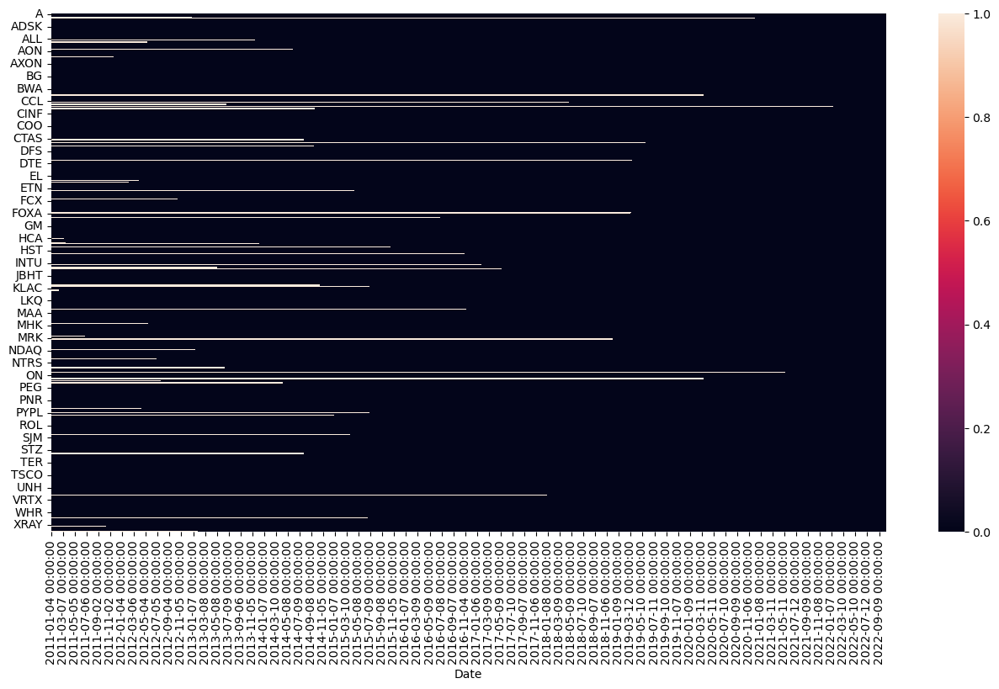

In [68]:
figure = plt.figure(figsize=(16, 8))
sns.heatmap(price_data.T.isnull());

The missing data is due to the fact that **certain stocks may move out of the S&P 500** and **certain stocks may enter the S&P 500** in this respective timeframe.

In [69]:
price_data_cleaned = price_data.dropna(axis=1) # dropping na values columnwise

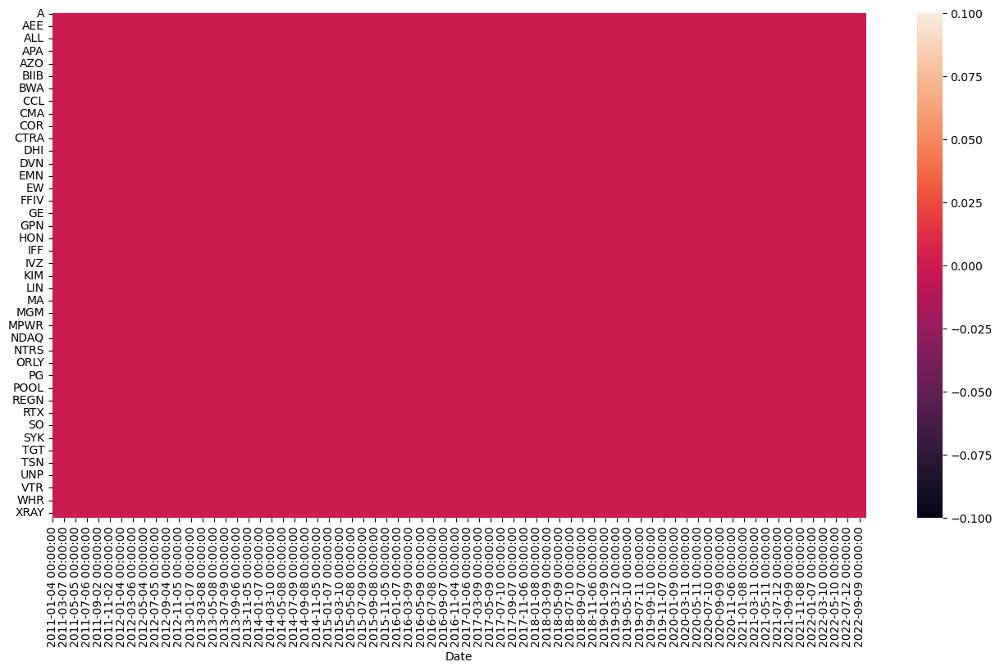

In [70]:
figure = plt.figure(figsize=(16, 8))
sns.heatmap(price_data_cleaned.T.isnull());

The null values are removed - the data is clean and the plot also helps in finding that there are no missing values.

In [71]:
price_data_cleaned

,A,AAL,AAPL,ABT,ACGL,ACN,ADBE,ADI,ADM,ADP,...,WTW,WY,WYNN,XEL,XOM,XRAY,YUM,ZBH,ZBRA,ZION
Date,,,,,,,,,,,,,,,,,,,,,
2011-01-04,26.761719,10.011913,10.042777,17.534925,9.771111,37.938488,31.510000,27.715338,21.820141,30.578331,...,71.031418,12.127102,79.662460,15.459666,45.591145,31.509117,27.222038,47.707191,37.840000,19.960485
2011-01-05,26.703672,10.464429,10.124928,17.534925,9.785556,37.946354,32.220001,27.774446,21.920691,31.067543,...,72.017624,12.505492,80.690247,15.368184,45.469410,31.808701,27.351572,47.742374,37.799999,20.073353
2011-01-06,26.755274,10.596413,10.116745,17.498598,9.653333,38.087822,32.270000,27.929564,22.761032,31.308878,...,72.223129,12.418652,81.278542,15.355118,45.761593,31.627129,27.543032,46.264713,37.480000,20.016924
2011-01-07,26.845572,10.747253,10.189198,17.571253,9.580000,38.150703,32.040001,27.767054,22.947779,31.380613,...,72.099854,12.759822,84.156296,15.492337,46.011143,31.500042,27.886547,46.255917,37.599998,19.807323
2011-01-10,27.232578,10.813246,10.381085,17.415047,9.547778,37.812729,32.959999,27.848303,23.048330,31.393658,...,72.284782,12.902493,84.135025,15.394323,45.731144,31.826845,27.925964,46.616547,37.709999,19.452610
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-07,126.545975,12.180000,139.263824,99.324982,45.669998,254.516464,288.769989,142.248611,83.668121,222.341522,...,201.950851,27.245607,72.731979,57.969372,97.800537,27.975342,106.933899,107.436928,266.679993,48.159771
2022-10-10,125.066422,12.050000,139.591873,98.680954,46.639999,252.693695,285.720001,138.302704,84.813850,223.878510,...,202.926498,27.445244,63.825821,58.308311,95.680542,27.650391,105.814789,106.126961,258.600006,47.758198
2022-10-11,124.758606,12.260000,138.160370,99.285942,46.590000,247.921066,284.829987,136.241409,84.510277,221.509430,...,199.142303,28.006124,59.347862,57.940319,94.867386,27.729166,103.321342,107.496468,250.009995,47.021988


### **Getting Yearwise Data**

In [85]:
def get_year_wise_data(data, year):
    year_wise_data = data.loc[pd.to_datetime(data.index).year==year]
    
    return year_wise_data

In [86]:
# Getting year wise data of S&P stocks from 2011 to 2022
stk_2011 = get_year_wise_data(price_data_cleaned, 2011)
stk_2012 = get_year_wise_data(price_data_cleaned, 2012)
stk_2013 = get_year_wise_data(price_data_cleaned, 2013)
stk_2014 = get_year_wise_data(price_data_cleaned, 2014)
stk_2015 = get_year_wise_data(price_data_cleaned, 2015)
stk_2016 = get_year_wise_data(price_data_cleaned, 2016)
stk_2017 = get_year_wise_data(price_data_cleaned, 2017)
stk_2018 = get_year_wise_data(price_data_cleaned, 2018)
stk_2019 = get_year_wise_data(price_data_cleaned, 2019)
stk_2020 = get_year_wise_data(price_data_cleaned, 2020)
stk_2021 = get_year_wise_data(price_data_cleaned, 2021)
stk_2022 = get_year_wise_data(price_data_cleaned, 2022)

In [87]:
stk_2011

,A,AAL,AAPL,ABT,ACGL,ACN,ADBE,ADI,ADM,ADP,...,WTW,WY,WYNN,XEL,XOM,XRAY,YUM,ZBH,ZBRA,ZION
Date,,,,,,,,,,,,,,,,,,,,,
2011-01-04,26.761719,10.011913,10.042777,17.534925,9.771111,37.938488,31.510000,27.715338,21.820141,30.578331,...,71.031418,12.127102,79.662460,15.459666,45.591145,31.509117,27.222038,47.707191,37.840000,19.960485
2011-01-05,26.703672,10.464429,10.124928,17.534925,9.785556,37.946354,32.220001,27.774446,21.920691,31.067543,...,72.017624,12.505492,80.690247,15.368184,45.469410,31.808701,27.351572,47.742374,37.799999,20.073353
2011-01-06,26.755274,10.596413,10.116745,17.498598,9.653333,38.087822,32.270000,27.929564,22.761032,31.308878,...,72.223129,12.418652,81.278542,15.355118,45.761593,31.627129,27.543032,46.264713,37.480000,20.016924
2011-01-07,26.845572,10.747253,10.189198,17.571253,9.580000,38.150703,32.040001,27.767054,22.947779,31.380613,...,72.099854,12.759822,84.156296,15.492337,46.011143,31.500042,27.886547,46.255917,37.599998,19.807323
2011-01-10,27.232578,10.813246,10.381085,17.415047,9.547778,37.812729,32.959999,27.848303,23.048330,31.393658,...,72.284782,12.902493,84.135025,15.394323,45.731144,31.826845,27.925964,46.616547,37.709999,19.452610
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2011-12-23,22.807768,5.298206,12.226611,21.114948,12.500000,42.409393,28.290001,27.480917,21.313984,36.482250,...,81.824348,11.617873,82.133316,18.521336,53.102825,32.485767,33.918903,46.801243,36.520000,13.192149
2011-12-27,22.736822,5.090804,12.323617,21.194109,12.550000,42.441483,28.500000,27.609932,21.299320,36.556114,...,82.159966,11.739358,84.769058,18.807327,53.140232,32.394600,34.074051,46.862804,36.590000,13.248697
2011-12-28,22.001497,4.892828,12.205695,21.043333,12.386667,42.385353,28.020000,27.017967,20.807899,36.126366,...,81.716522,11.816082,81.550919,18.698380,52.454811,31.823868,33.890182,46.757271,35.700001,12.998265


In [88]:
stk_2011.shift(1)

,A,AAL,AAPL,ABT,ACGL,ACN,ADBE,ADI,ADM,ADP,...,WTW,WY,WYNN,XEL,XOM,XRAY,YUM,ZBH,ZBRA,ZION
Date,,,,,,,,,,,,,,,,,,,,,
2011-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-05,26.761719,10.011913,10.042777,17.534925,9.771111,37.938488,31.510000,27.715338,21.820141,30.578331,...,71.031418,12.127102,79.662460,15.459666,45.591145,31.509117,27.222038,47.707191,37.840000,19.960485
2011-01-06,26.703672,10.464429,10.124928,17.534925,9.785556,37.946354,32.220001,27.774446,21.920691,31.067543,...,72.017624,12.505492,80.690247,15.368184,45.469410,31.808701,27.351572,47.742374,37.799999,20.073353
2011-01-07,26.755274,10.596413,10.116745,17.498598,9.653333,38.087822,32.270000,27.929564,22.761032,31.308878,...,72.223129,12.418652,81.278542,15.355118,45.761593,31.627129,27.543032,46.264713,37.480000,20.016924
2011-01-10,26.845572,10.747253,10.189198,17.571253,9.580000,38.150703,32.040001,27.767054,22.947779,31.380613,...,72.099854,12.759822,84.156296,15.492337,46.011143,31.500042,27.886547,46.255917,37.599998,19.807323
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2011-12-23,22.472361,5.373627,12.081710,20.975498,12.300000,42.160835,27.889999,27.275997,21.049938,36.146511,...,80.691711,11.700989,80.669830,18.385141,52.523342,32.412846,33.551167,46.651718,36.380001,13.046739
2011-12-27,22.807768,5.298206,12.226611,21.114948,12.500000,42.409393,28.290001,27.480917,21.313984,36.482250,...,81.824348,11.617873,82.133316,18.521336,53.102825,32.485767,33.918903,46.801243,36.520000,13.192149
2011-12-28,22.736822,5.090804,12.323617,21.194109,12.550000,42.441483,28.500000,27.609932,21.299320,36.556114,...,82.159966,11.739358,84.769058,18.807327,53.140232,32.394600,34.074051,46.862804,36.590000,13.248697


### **Computing the Daily Log Returns**

Statistically, **simple stock returns are always assumed to follow a Log Normal distribution**. It is therefore plausible to use properties of the Normal distribution in statistical estimation for Log returns, but not for the simple returns.

Stock Returns analysis is a time series analysis, in which you also take care of stationarity which is normally obtained from Log returns but not from simple returns.

In [89]:
# Calculating daily log returns by subtracting between two days with the help of shift function
log_returns_2011 = np.log(stk_2011.shift(1)) - np.log(stk_2011)
log_returns_2012 = np.log(stk_2012.shift(1)) - np.log(stk_2012)
log_returns_2013 = np.log(stk_2013.shift(1)) - np.log(stk_2013)
log_returns_2014 = np.log(stk_2014.shift(1)) - np.log(stk_2014)
log_returns_2015 = np.log(stk_2015.shift(1)) - np.log(stk_2015)
log_returns_2016 = np.log(stk_2016.shift(1)) - np.log(stk_2016)
log_returns_2017 = np.log(stk_2017.shift(1)) - np.log(stk_2017)
log_returns_2018 = np.log(stk_2018.shift(1)) - np.log(stk_2018)
log_returns_2019 = np.log(stk_2019.shift(1)) - np.log(stk_2019)
log_returns_2020 = np.log(stk_2020.shift(1)) - np.log(stk_2020)
log_returns_2021 = np.log(stk_2021.shift(1)) - np.log(stk_2021)
log_returns_2022 = np.log(stk_2022.shift(1)) - np.log(stk_2022)

### **Computing the Correlation of Returns**

In [90]:
# Computing adjacency matrix:
return_correlation_2011 = log_returns_2011.corr()
return_correlation_2012 = log_returns_2012.corr()
return_correlation_2013 = log_returns_2013.corr()
return_correlation_2014 = log_returns_2014.corr()
return_correlation_2015 = log_returns_2015.corr()
return_correlation_2016 = log_returns_2016.corr()
return_correlation_2017 = log_returns_2017.corr()
return_correlation_2018 = log_returns_2018.corr()
return_correlation_2019 = log_returns_2019.corr()
return_correlation_2020 = log_returns_2020.corr()
return_correlation_2021 = log_returns_2021.corr()
return_correlation_2022 = log_returns_2022.corr()

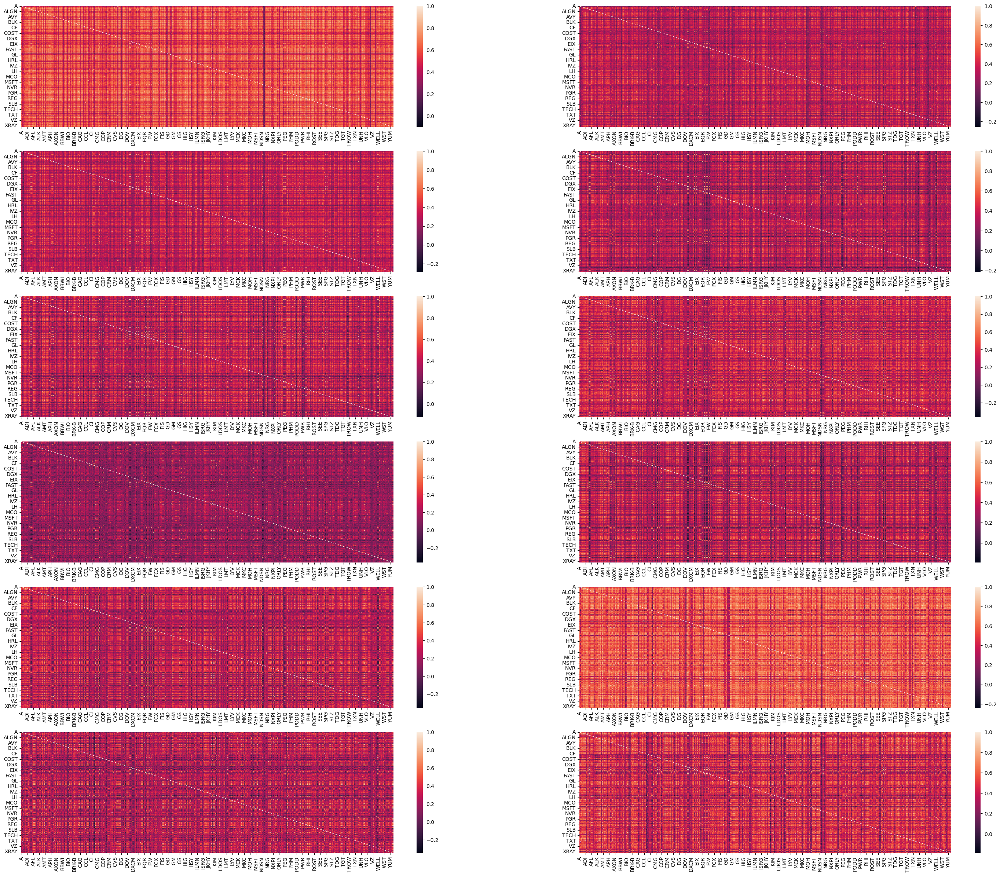

In [91]:
figure, axes = plt.subplots(6, 2, figsize=(36, 30))
sns.heatmap(return_correlation_2011, ax=axes[0, 0]);
sns.heatmap(return_correlation_2012, ax=axes[0, 1]);
sns.heatmap(return_correlation_2013, ax=axes[1, 0]);
sns.heatmap(return_correlation_2014, ax=axes[1, 1]);
sns.heatmap(return_correlation_2015, ax=axes[2, 0]);
sns.heatmap(return_correlation_2016, ax=axes[2, 1]);
sns.heatmap(return_correlation_2017, ax=axes[3, 0]);
sns.heatmap(return_correlation_2018, ax=axes[3, 1]);
sns.heatmap(return_correlation_2019, ax=axes[4, 0]);
sns.heatmap(return_correlation_2020, ax=axes[4, 1]);
sns.heatmap(return_correlation_2021, ax=axes[5, 0]);
sns.heatmap(return_correlation_2022, ax=axes[5, 1]);

### **Inferences**

The first plot for the year 2011 shows that there is high correlation among the stocks. It shows that since in 2011 there was a market crash and there was volatility in the market, the prices of the stock went down along with the other stocks and this is the reason for high correlation.

Similarly in 2013, 2014 and 2017 the market is kind of stable, and hence the correlation among stocks is low.

In 2020, due to the COVID pandemic and the volatility in the market, the prices of the stock went down or up along with other stocks, and this is the reason for high correlation.

From this we can infer that, **In stable market conditions, correlation matrices have low correlation values whereas in critical market conditions, correlation matrices have high correlation values.**

### **Creating Graphs**

In [92]:
graph_2011 = nx.Graph(return_correlation_2011)

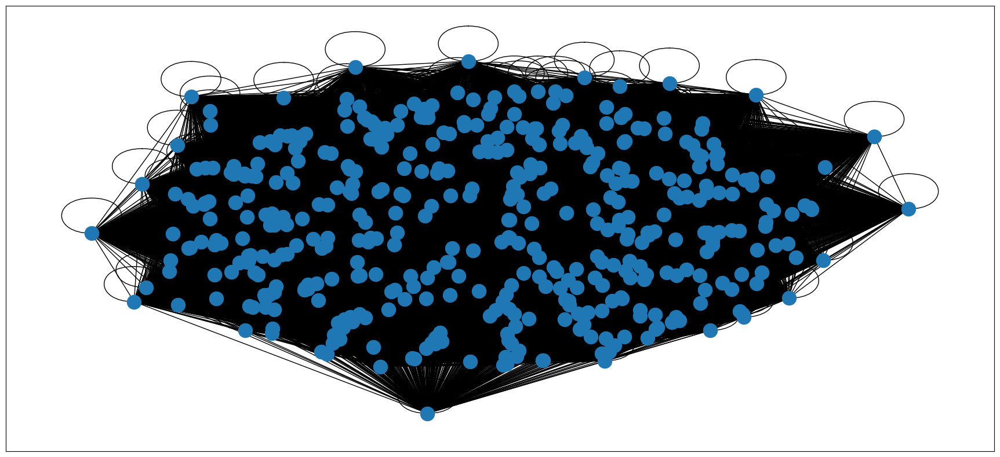

In [93]:
figure = plt.figure(figsize=(22, 10))
nx.draw_networkx(graph_2011, with_labels=False)

This is a **fully connected network** as we created it using the correlation matrix.

A fully connected network means every variable has connections with all the other variables in the network and will also have self-loops.

### **Filtering Graphs using MST**

**MST - Minimum Spanning Tree**

A minimum spanning tree (MST) or minimum weight spanning tree is a subset of the edges of a connected, edge-weighted undirected graph that connects all the vertices together, without any cycles and with the minimum possible total edge weight.That is, it is a spanning tree whose sum of edge weights is as small as possible.

**MST** is one of the popular techniques to eliminate the redundancies and noise and meanwhile maintain the significant links in the network.

While removing redundancy and noise in the data using MST, we might lose some information as well.

You can find more on MST [here](https://visualgo.net/en/mst)

In [94]:
distance_2011 = np.sqrt(2 * (1 - return_correlation_2011))
distance_2012 = np.sqrt(2 * (1 - return_correlation_2012))
distance_2013 = np.sqrt(2 * (1 - return_correlation_2013))
distance_2014 = np.sqrt(2 * (1 - return_correlation_2014))
distance_2015 = np.sqrt(2 * (1 - return_correlation_2015))
distance_2016 = np.sqrt(2 * (1 - return_correlation_2016))
distance_2017 = np.sqrt(2 * (1 - return_correlation_2017))
distance_2018 = np.sqrt(2 * (1 - return_correlation_2018))
distance_2019 = np.sqrt(2 * (1 - return_correlation_2019))
distance_2020 = np.sqrt(2 * (1 - return_correlation_2020))
distance_2021 = np.sqrt(2 * (1 - return_correlation_2021))
distance_2022 = np.sqrt(2 * (1 - return_correlation_2022))

Before the construction of the MST graph, **the correlation coefficient is converted into a distance.**

In [95]:
distance_2011_graph = nx.Graph(distance_2011)
distance_2012_graph = nx.Graph(distance_2012)
distance_2013_graph = nx.Graph(distance_2013)
distance_2014_graph = nx.Graph(distance_2014)
distance_2015_graph = nx.Graph(distance_2015)
distance_2016_graph = nx.Graph(distance_2016)
distance_2017_graph = nx.Graph(distance_2017)
distance_2018_graph = nx.Graph(distance_2018)
distance_2019_graph = nx.Graph(distance_2019)
distance_2020_graph = nx.Graph(distance_2020)
distance_2021_graph = nx.Graph(distance_2021)
distance_2022_graph = nx.Graph(distance_2022)

In [96]:
graph_2011_filtered = nx.minimum_spanning_tree(distance_2011_graph)
graph_2012_filtered = nx.minimum_spanning_tree(distance_2012_graph)
graph_2013_filtered = nx.minimum_spanning_tree(distance_2013_graph)
graph_2014_filtered = nx.minimum_spanning_tree(distance_2014_graph)
graph_2015_filtered = nx.minimum_spanning_tree(distance_2015_graph)
graph_2016_filtered = nx.minimum_spanning_tree(distance_2016_graph)
graph_2017_filtered = nx.minimum_spanning_tree(distance_2017_graph)
graph_2018_filtered = nx.minimum_spanning_tree(distance_2018_graph)
graph_2019_filtered = nx.minimum_spanning_tree(distance_2019_graph)
graph_2020_filtered = nx.minimum_spanning_tree(distance_2020_graph)
graph_2021_filtered = nx.minimum_spanning_tree(distance_2021_graph)
graph_2022_filtered = nx.minimum_spanning_tree(distance_2022_graph)

We choose the MST method to filter out the network graph in each window so as to eliminate the redundancies and noise, and still maintain significant links.

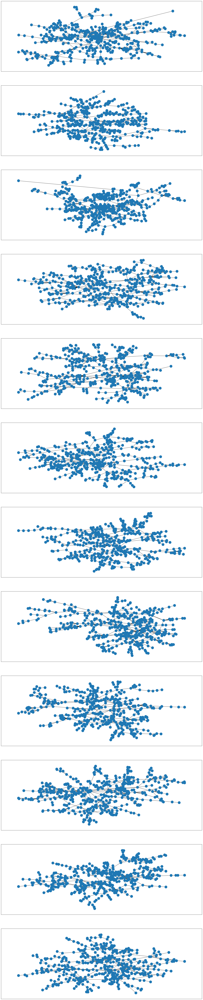

In [97]:
figure, axes = plt.subplots(12, 1, figsize=(24, 120))
nx.draw_networkx(graph_2011_filtered, with_labels=False, ax=axes[0])
nx.draw_networkx(graph_2012_filtered, with_labels=False, ax=axes[1])
nx.draw_networkx(graph_2013_filtered, with_labels=False, ax=axes[2])
nx.draw_networkx(graph_2014_filtered, with_labels=False, ax=axes[3])
nx.draw_networkx(graph_2015_filtered, with_labels=False, ax=axes[4])
nx.draw_networkx(graph_2016_filtered, with_labels=False, ax=axes[5])
nx.draw_networkx(graph_2017_filtered, with_labels=False, ax=axes[6])
nx.draw_networkx(graph_2018_filtered, with_labels=False, ax=axes[7])
nx.draw_networkx(graph_2019_filtered, with_labels=False, ax=axes[8])
nx.draw_networkx(graph_2020_filtered, with_labels=False, ax=axes[9])
nx.draw_networkx(graph_2021_filtered, with_labels=False, ax=axes[10])
nx.draw_networkx(graph_2022_filtered, with_labels=False, ax=axes[11])

On plotting the graphs, we see that the network looks different every year, and no two yearwise graphs look very similar.

### **Computing Graph Statistics over Time**

In [98]:
average_degree_connectivity = []
average_shortest_path_length = []
year = [2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022]

for graph in [graph_2011_filtered, graph_2012_filtered, graph_2013_filtered, graph_2014_filtered, graph_2015_filtered, 
              graph_2016_filtered, graph_2017_filtered, graph_2018_filtered, graph_2019_filtered, graph_2020_filtered, 
              graph_2021_filtered, graph_2022_filtered]:
    average_shortest_path_length.append(nx.average_shortest_path_length(graph))

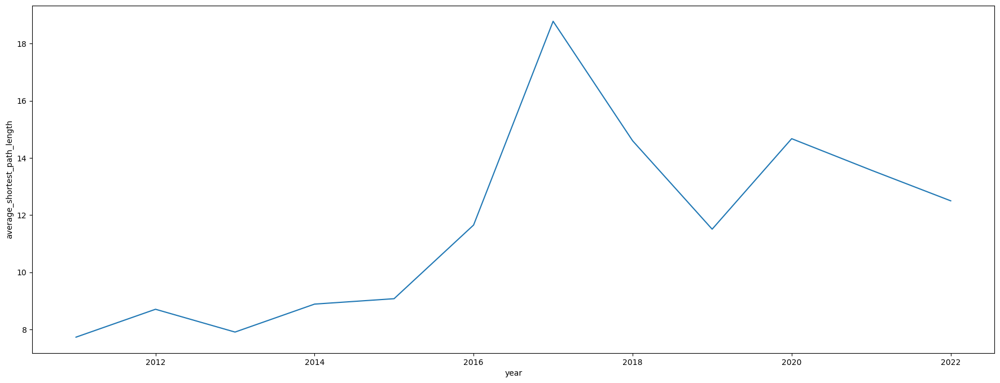

In [99]:
figure = plt.figure(figsize=(22, 8))
sns.lineplot(x='year', y='average_shortest_path_length', 
             data=pd.DataFrame({'year': year, 'average_shortest_path_length': average_shortest_path_length}));

From the above plot we can see that the shortest path length had significant increment since 2012 and decrement in 2019 and 2022 respectively. In 2020 there were increment again. May be this has some correlation with the financial queries. 

### **Portfolio Construction**

In [100]:
log_returns_2011_till_2022 = np.log(price_data_cleaned.shift(1)) - np.log(price_data_cleaned)
return_correlation_2011_till_2022 = log_returns_2011_till_2022.corr()

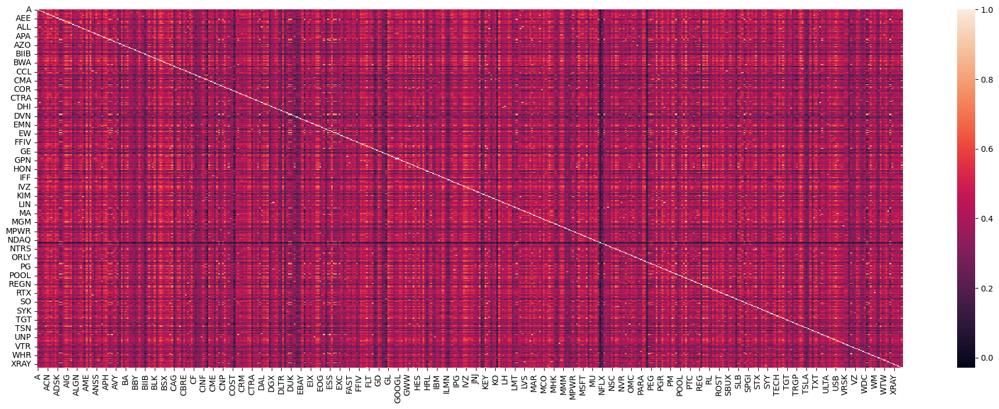

In [101]:
figure = plt.figure(figsize=(24, 8))
sns.heatmap(return_correlation_2011_till_2022);

In [102]:
distance_2011_till_2022 = np.sqrt(2 * (1 - return_correlation_2011_till_2022))
distance_2011_till_2022_graph = nx.Graph(distance_2011_till_2022)
distance_2011_till_2022_graph_filtered = nx.minimum_spanning_tree(distance_2011_till_2022_graph)

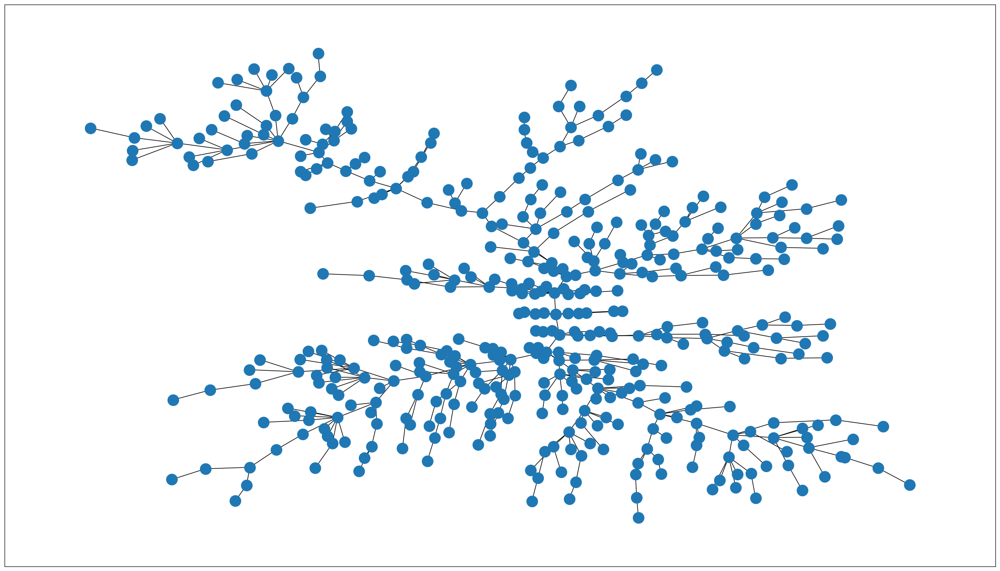

In [103]:
figure = plt.figure(figsize=(28, 16))
nx.draw_networkx(distance_2011_till_2022_graph_filtered,pos=nx.kamada_kawai_layout(distance_2011_till_2022_graph_filtered), with_labels=False)

In [104]:
degree_centrality = nx.degree_centrality(distance_2011_till_2022_graph_filtered)
closeness_centrality = nx.closeness_centrality(distance_2011_till_2022_graph_filtered)
betweenness_centrality = nx.betweenness_centrality(distance_2011_till_2022_graph_filtered)
eigenvector_centrality=nx.eigenvector_centrality_numpy(distance_2011_till_2022_graph_filtered)

In [105]:
keys = []
values = []

for key, value in degree_centrality.items():
    keys.append(key)
    values.append(value)

dc_data = pd.DataFrame({'stocks': keys, 'degree_centrality': values}).sort_values('degree_centrality', ascending=False)
px.bar(data_frame=dc_data, x='stocks', y='degree_centrality', template='plotly_dark')

**Degree centrality** is the simplest centrality measure. It
defines the relative significance of a stock in terms of the
**number of edges incident upon it.** The stocks with the high
scores will influence the behavior of many other
stocks which are directly connected to it. 

Based on this
measure, **0165.hk has the highest number of edges with other
stocks and hence the highest degree centrality.**

In [106]:
keys = []
values = []

for key, value in closeness_centrality.items():
    keys.append(key)
    values.append(value)

cc_data = pd.DataFrame({'stocks': keys, 'closeness_centrality': values}).sort_values('closeness_centrality', 
                                                                                       ascending=False)
px.bar(data_frame=cc_data, x='stocks', y='closeness_centrality', template='plotly_dark')

**Closeness centrality** also involves the shortest path
between all possible pairs of stocks on a network. 

It is
defined as the average number of shortest paths between a
stock and all other stocks reachable from it.

In [107]:
keys = []
values = []

for key, value in betweenness_centrality.items():
    keys.append(key)
    values.append(value)

bc_data = pd.DataFrame({'stocks': keys, 'betweenness_centrality': values}).sort_values('betweenness_centrality', 
                                                                                       ascending=False)
px.bar(data_frame=bc_data, x='stocks', y='betweenness_centrality', template='plotly_dark')

**Betweenness centrality** is the sum of the fraction of all possible shortest paths between any stocks that pass through a stock. It is used to **quantify the control of a stock on information flow in the network.** 

So, the stock with the highest score is considered a significant stock in terms of its role in coordinating the information among stocks. 

### **Selecting Stocks based on Network Topological Parameters**

In [108]:
# we already computed degree centrality above

# we already computed betweenness centrality above

# distance on degree criterion
distance_degree_criteria = {}
node_with_largest_degree_centrality = max(dict(degree_centrality), key=dict(degree_centrality).get)
for node in distance_2011_till_2022_graph_filtered.nodes():
    distance_degree_criteria[node] = nx.shortest_path_length(distance_2011_till_2022_graph_filtered, node, 
                                                             node_with_largest_degree_centrality)

# distance on correlation criterion
distance_correlation_criteria = {}
sum_correlation = {}

for node in distance_2011_till_2022_graph_filtered.nodes():
    neighbors = nx.neighbors(distance_2011_till_2022_graph_filtered, node)
    sum_correlation[node] = sum(return_correlation_2011_till_2022[node][neighbor] for neighbor in neighbors)

node_with_highest_correlation = max(sum_correlation, key=sum_correlation.get)
    
for node in distance_2011_till_2022_graph_filtered.nodes():
    distance_correlation_criteria[node] = nx.shortest_path_length(distance_2011_till_2022_graph_filtered, node, 
                                                             node_with_highest_correlation)    

# distance on distance criterion
distance_distance_criteria = {}
mean_distance = {}

for node in distance_2011_till_2022_graph_filtered.nodes():
    nodes = list(distance_2011_till_2022_graph_filtered.nodes())
    nodes.remove(node)
    distance_distance = [nx.shortest_path_length(distance_2011_till_2022_graph_filtered, node, ns) for ns in nodes]
    mean_distance[node] = np.mean(distance_distance)
    
node_with_minimum_mean_distance = min(mean_distance, key=mean_distance.get)

for node in distance_2011_till_2022_graph_filtered.nodes():
    distance_distance_criteria[node] = nx.shortest_path_length(distance_2011_till_2022_graph_filtered, node, 
                                                             node_with_minimum_mean_distance)

**Distance refers to the smallest length from a node to the central node of the network**. 

Here,
three types of definitions of central node are introduced to reduce the error caused by a single
method. 

Therefore three types of distances are described here.

**1. Distance on degree criterion** (Ddegree), the central node is the one that has the largest degree.

**2. Distance on correlation criterion** (Dcorrelation), the central node is the one with the highest value of the sum of correlation coefficients with its neighbors.

**3. Distance on distance criterion** (Ddistance), the central node is the one that produces the lowest value for the mean distance.

In [109]:
node_stats = pd.DataFrame.from_dict(dict(degree_centrality), orient='index')
node_stats.columns = ['degree_centrality']
node_stats['betweenness_centrality'] = betweenness_centrality.values()

node_stats['average_centrality'] = 0.5 * (node_stats['degree_centrality'] + node_stats['betweenness_centrality'])

node_stats['distance_degree_criteria'] = distance_degree_criteria.values()
node_stats['distance_correlation_criteria'] = distance_correlation_criteria.values()
node_stats['distance_distance_criteria'] = distance_distance_criteria.values()
node_stats['average_distance'] = (node_stats['distance_degree_criteria'] + node_stats['distance_correlation_criteria'] +
                                  node_stats['distance_distance_criteria']) / 3

In [110]:
node_stats.head()

,degree_centrality,betweenness_centrality,average_centrality,distance_degree_criteria,distance_correlation_criteria,distance_distance_criteria,average_distance
A,0.013514,0.074512,0.044013,6,6,4,5.333333
AAL,0.002252,0.000000,0.001126,9,9,11,9.666667
AAPL,0.002252,0.000000,0.001126,12,12,10,11.333333
ABT,0.004505,0.008989,0.006747,8,8,6,7.333333
ACGL,0.004505,0.004505,0.004505,4,4,6,4.666667


We use the parameters defined above to select the portfolios. 

**The nodes with the largest 10% of degree or betweenness centrality are chosen to be in the central portfolio.** 

**The nodes whose degree equals to 1 or betweenness centrality equals to 0 are chosen to be in the peripheral portfolio.**


Similarly, we define the node's ranking in the top 10% of distance as the stocks of the peripheral portfolios, and the bottom 10% as the stocks of the central portfolios. 

The central portfolios and peripheral portfolios represent two opposite sides of correlation and agglomeration. Generally speaking, central stocks play a vital role in the market and impose a strong influence on other stocks. On the other hand, the correlations between peripheral stocks are weak and contain much more noise than those of the central stocks.

In [111]:
central_stocks = node_stats.sort_values('average_centrality', ascending=False).head(15)
central_portfolio = [stock for stock in central_stocks.index.values]

In [112]:
peripheral_stocks = node_stats.sort_values('average_distance', ascending=False).head(15)
peripheral_portfolio = [stock for stock in peripheral_stocks.index.values]

In [113]:
central_stocks

,degree_centrality,betweenness_centrality,average_centrality,distance_degree_criteria,distance_correlation_criteria,distance_distance_criteria,average_distance
PH,0.020270,0.613518,0.316894,3,3,1,2.333333
ETN,0.018018,0.569571,0.293794,2,2,0,1.333333
AMP,0.029279,0.547028,0.288154,0,0,2,0.666667
PRU,0.015766,0.550790,0.283278,1,1,3,1.666667
AME,0.020270,0.518730,0.269500,1,1,1,1.000000
ITW,0.022523,0.364458,0.193490,4,4,2,3.333333
PFG,0.006757,0.376579,0.191668,2,2,4,2.666667
HST,0.006757,0.369807,0.188282,3,3,5,3.666667
REG,0.006757,0.329439,0.168098,5,5,7,5.666667
KIM,0.004505,0.318549,0.161527,4,4,6,4.666667


In [114]:
peripheral_stocks

,degree_centrality,betweenness_centrality,average_centrality,distance_degree_criteria,distance_correlation_criteria,distance_distance_criteria,average_distance
INCY,0.002252,0.000000,0.001126,17,17,19,17.666667
CLX,0.002252,0.000000,0.001126,17,17,19,17.666667
BIIB,0.002252,0.000000,0.001126,16,16,18,16.666667
CPB,0.002252,0.000000,0.001126,16,16,18,16.666667
HRL,0.002252,0.000000,0.001126,16,16,18,16.666667
REGN,0.004505,0.004505,0.004505,16,16,18,16.666667
SJM,0.002252,0.000000,0.001126,16,16,18,16.666667
K,0.002252,0.000000,0.001126,16,16,18,16.666667
KMB,0.004505,0.004505,0.004505,16,16,18,16.666667
CHD,0.002252,0.000000,0.001126,16,16,18,16.666667


### **Selecting the top 15 stocks for both Central Stocks and Peripheral Stocks**

In [115]:
color = []

for node in distance_2011_till_2022_graph_filtered:
    if node in central_portfolio:
        color.append('red')
        
    elif node in peripheral_portfolio:
        color.append('green')
        
    else:
        color.append('blue')

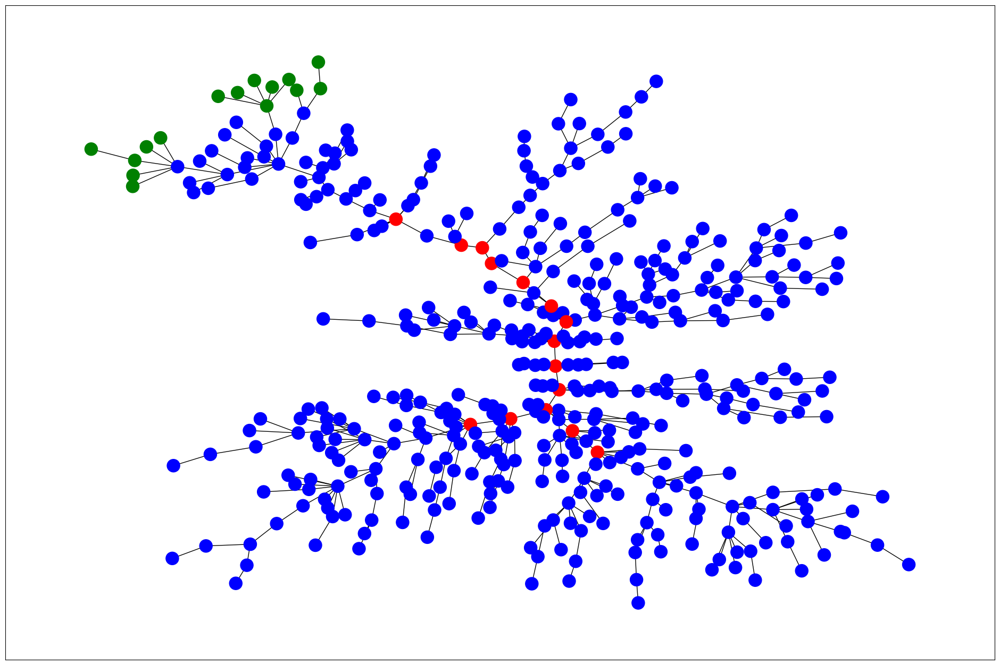

In [116]:
figure = plt.figure(figsize=(24, 16))
nx.draw_networkx(distance_2011_till_2022_graph_filtered,pos=nx.kamada_kawai_layout(distance_2011_till_2022_graph_filtered), with_labels=False, node_color=color)

Here, **the red stocks are the central portfolio stocks, and the green ones are the peripheral portfolio stocks.**

### **Performance Evalutation**

Here we evaluate the performance of the stocks by comparing the performance of the Central Portfolio, Peripheral and S&P 500 Stocks in 2021, and **finding out which portfolio performs the best.**

In [ ]:
# collecting data for stocks for the year 2021
# %time price_data_2021 = web.DataReader(tickers, 'yahoo', start='2021-01-01', end='2021-12-31')

In [117]:
price_data_2023 = yf.download(stk[0],'2022-10-17','2023-10-17')
price_data_2023 = price_data_2023['Adj Close']
stk2 = [stk[0]]
for i in range(1,len(stk)):
    try:
        df = yf.download(stk[i],'2022-10-17','2023-10-17')
        df = df['Adj Close']
        stk2.append(stk[i])
        price_data_2023 = pd.concat([price_data_2023,df],axis=1)
    except:
        continue

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

In [118]:
price_data_2023.columns = stk2

In [119]:
price_data_2023 = price_data_2023.iloc[1:-1]

In [120]:
price_data_2023.dropna(how='all',axis=1, inplace=True)

In [121]:
price_data_2023_cleaned = price_data_2023.dropna(axis=1)

In [122]:
price_data_2023_cleaned

,A,AAL,AAPL,ABBV,ABNB,ABT,ACGL,ACN,ADBE,ADI,...,WYNN,XEL,XOM,XRAY,XYL,YUM,ZBH,ZBRA,ZION,ZTS
Date,,,,,,,,,,,,,,,,,,,,,
2022-10-18,131.371872,13.70,142.902252,138.985275,117.940002,102.921082,48.639999,259.920410,292.980011,138.499039,...,56.312801,59.673779,97.577896,28.950193,92.434021,109.437187,108.201065,263.890015,49.699120,149.100357
2022-10-19,128.055313,13.99,143.011597,137.572357,116.870003,96.185814,48.720001,259.930298,299.829987,138.724808,...,54.213139,59.170208,100.472313,28.379068,91.762344,108.426048,107.297981,260.459991,47.060234,146.830460
2022-10-20,125.056503,13.46,142.544357,137.380096,117.000000,93.342682,47.520000,257.685944,302.380005,139.460953,...,55.855057,57.843475,100.607834,28.201820,89.925125,107.650536,105.521591,256.230011,45.061939,143.162903
2022-10-21,128.968872,13.71,146.401489,141.349747,119.949997,93.195625,48.230000,265.354126,306.369995,143.887833,...,58.511974,58.976524,102.476151,28.615396,92.710602,108.995415,106.573524,263.040009,45.721664,145.918533
2022-10-24,131.371872,14.10,148.568634,145.031021,116.389999,96.362282,49.340000,271.004303,316.220001,141.865799,...,56.253098,59.635048,103.192490,29.058512,94.824387,106.776833,108.201065,265.720001,47.595654,148.059570
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-10-09,111.279999,12.24,178.990005,147.632278,127.769997,96.227318,82.070000,310.721283,529.289978,173.320007,...,93.070000,57.650002,110.919998,31.959999,91.089996,118.910004,110.690002,222.580002,33.970001,174.600006
2023-10-10,113.290001,12.26,178.389999,147.414459,131.589996,97.022911,81.860001,311.029999,532.719971,175.970001,...,93.989998,58.060001,110.449997,32.400002,91.949997,120.370003,112.190002,222.399994,35.119999,175.630005
2023-10-11,113.379997,12.48,179.800003,147.860001,130.000000,92.129997,83.019997,312.540009,549.909973,174.919998,...,94.730003,58.810001,106.489998,31.799999,92.370003,118.379997,105.349998,217.160004,35.650002,176.949997


In [123]:
SP_2023 = yf.download('^GSPC','2022-10-17','2023-10-17')

[*********************100%***********************]  1 of 1 completed


In [124]:
pd.isna(SP_2023['Adj Close']).sum()

0

In [125]:
SP_2023 = SP_2023['Adj Close']

In [126]:
amount = 100000

central_portfolio_value = pd.DataFrame()
for stock in central_portfolio:
    central_portfolio_value[stock] = price_data_2023_cleaned[stock]
    
portfolio_unit = central_portfolio_value.sum(axis=1)[0]
share = amount / portfolio_unit
central_portfolio_value = central_portfolio_value.sum(axis=1) * share

peripheral_portfolio_value = pd.DataFrame()
for stock in peripheral_portfolio:
    peripheral_portfolio_value[stock] = price_data_2023_cleaned[stock]
    
portfolio_unit = peripheral_portfolio_value.sum(axis=1)[0]
share = amount / portfolio_unit
peripheral_portfolio_value = peripheral_portfolio_value.sum(axis=1) * share

In [128]:
SP_2023_value = SP_2023 * (amount / SP_2023.iloc[0])

In [129]:
all_portfolios = pd.concat([SP_2023_value, central_portfolio_value, peripheral_portfolio_value], axis=1)
all_portfolios.columns = ['SP500', 'central_portfolio', 'peripheral_portfolio']

In [130]:
all_portfolios.head()

,SP500,central_portfolio,peripheral_portfolio
Date,,,
2022-10-17,100000.000000,NaN,NaN
2022-10-18,101142.756967,100000.000000,100000.000000
2022-10-19,100467.922652,99005.977386,98754.071354
2022-10-20,99669.111270,97276.573419,97676.514132
2022-10-21,102033.742977,100300.410813,99327.366999


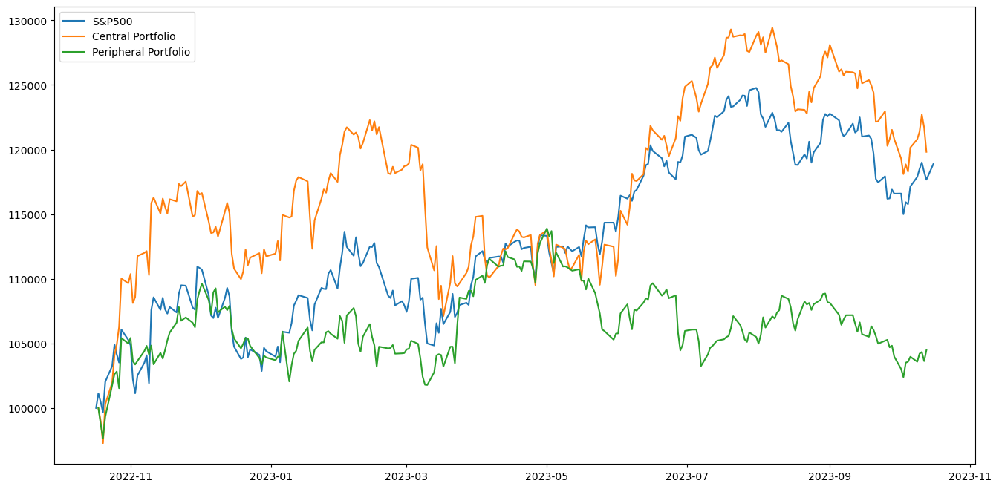

In [131]:
figure, ax = plt.subplots(figsize=(16, 8))
snp_500_line = ax.plot(all_portfolios['SP500'], label='S&P500')
central_portfolio_line = ax.plot(all_portfolios['central_portfolio'], label= 'Central Portfolio')
peripheral_portfolio_line = ax.plot(all_portfolios['peripheral_portfolio'], label= 'Peripheral Portfolio')
ax.legend(loc='upper left')
plt.show()

As seen from the above plot, it is clear that **the Central Portfolio stocks perform better and the Peripheral Portfolio stocks perform poorer in comparison to the S&P500 stocks in 2023.**

   Both the portfolios have their own features under different market conditions.
   
   Generally, **in stable market conditions Central Portfolio Stocks will perform better whereas Peripheral Portfolio Stocks will perform better in crisis market conditions**. This is due to peripheral portfolio stocks are kind of having a weak correlation so they will not be impacted by all other stocks that were present in our network.
   
   We can rebalance our stocks portfolio by using the network analysis.